In [2]:
import torch 

print(torch.__version__)
print(torch.cuda.is_available())
print(torch.version.cuda)
print(torch.backends.cudnn.version())
print(torch.cuda.get_device_name(0))

2.10.0+cu128
True
12.8
91002
NVIDIA GeForce RTX 4070 Laptop GPU


In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import os
import numpy as np
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt
from tqdm import tqdm

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Check for GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


class IntelImageDataset(Dataset):
    """Custom Dataset for Intel Image Classification"""
    
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls_name: idx for idx, cls_name in enumerate(self.classes)}
        
        self.images = []
        self.labels = []
        
        for class_name in self.classes:
            class_path = os.path.join(root_dir, class_name)
            if os.path.isdir(class_path):
                for img_name in os.listdir(class_path):
                    if img_name.endswith(('.jpg', '.jpeg', '.png')):
                        self.images.append(os.path.join(class_path, img_name))
                        self.labels.append(self.class_to_idx[class_name])
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return image, label


class CustomCNN(nn.Module):
    """Custom CNN architecture for image classification"""
    
    def __init__(self, num_classes=6):
        super(CustomCNN, self).__init__()
        
        # First convolutional block
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout(0.25)
        )
        
        # Second convolutional block
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout(0.25)
        )
        
        # Third convolutional block
        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout(0.25)
        )
        
        # Fourth convolutional block
        self.conv4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout(0.25)
        )
        
        # Adaptive pooling to handle different input sizes
        self.adaptive_pool = nn.AdaptiveAvgPool2d((4, 4))
        
        # Fully connected layers
        self.fc = nn.Sequential(
            nn.Linear(512 * 4 * 4, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.adaptive_pool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x


def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=50, early_stopping_patience=10):
    """Train the model with early stopping"""
    
    best_val_acc = 0.0
    best_model_weights = None
    patience_counter = 0
    
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    lr_history = []
    
    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        print('-' * 60)
        
        # Training phase
        model.train()
        running_loss = 0.0
        all_preds = []
        all_labels = []
        
        train_pbar = tqdm(train_loader, desc='Training')
        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            
            train_pbar.set_postfix({'loss': f'{loss.item():.4f}'})
        
        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = accuracy_score(all_labels, all_preds)
        train_losses.append(epoch_loss)
        train_accs.append(epoch_acc)
        
        print(f'Train Loss: {epoch_loss:.4f} | Train Acc: {epoch_acc:.4f}')
        
        # Validation phase
        model.eval()
        val_running_loss = 0.0
        val_preds = []
        val_labels = []
        
        with torch.no_grad():
            val_pbar = tqdm(val_loader, desc='Validation')
            for inputs, labels in val_pbar:
                inputs, labels = inputs.to(device), labels.to(device)
                
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                
                val_running_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_preds.extend(preds.cpu().numpy())
                val_labels.extend(labels.cpu().numpy())
                
                val_pbar.set_postfix({'loss': f'{loss.item():.4f}'})
        
        val_epoch_loss = val_running_loss / len(val_loader.dataset)
        val_epoch_acc = accuracy_score(val_labels, val_preds)
        val_losses.append(val_epoch_loss)
        val_accs.append(val_epoch_acc)
        
        print(f'Val Loss: {val_epoch_loss:.4f} | Val Acc: {val_epoch_acc:.4f}')
        
        # Learning rate scheduling
        scheduler.step(val_epoch_loss)
        for param_group in optimizer.param_groups:
            lr_history.append(param_group['lr'])
        
        # Early stopping and model checkpointing
        if val_epoch_acc > best_val_acc:
            best_val_acc = val_epoch_acc
            best_model_weights = model.state_dict().copy()
            patience_counter = 0
            print(f'✓ New best validation accuracy: {best_val_acc:.4f}')
        else:
            patience_counter += 1
            print(f'Patience: {patience_counter}/{early_stopping_patience}')
        
        if patience_counter >= early_stopping_patience:
            print(f'\nEarly stopping triggered after {epoch+1} epochs')
            break
    
    # Load best model weights
    model.load_state_dict(best_model_weights)
    
    return model, train_losses, train_accs, val_losses, val_accs, lr_history


def evaluate_model(model, test_loader, class_names):
    """Evaluate the model on test set"""
    
    model.eval()
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        test_pbar = tqdm(test_loader, desc='Testing')
        for inputs, labels in test_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    test_acc = accuracy_score(all_labels, all_preds)
    print(f'\nTest Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)')
    
    print('\nClassification Report:')
    print(classification_report(all_labels, all_preds, target_names=class_names))
    
    return test_acc


def plot_training_history(train_losses, train_accs, val_losses, val_accs):
    """Plot training history"""
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot losses
    ax1.plot(train_losses, label='Train Loss')
    ax1.plot(val_losses, label='Val Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Training and Validation Loss')
    ax1.legend()
    ax1.grid(True)
    
    # Plot accuracies
    ax2.plot(train_accs, label='Train Acc')
    ax2.plot(val_accs, label='Val Acc')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Training and Validation Accuracy')
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.savefig('/home/muhammad_adib/imgclass_cnn/training_history.png', dpi=300, bbox_inches='tight')
    print("\nTraining history plot saved as 'training_history.png'")

Using device: cuda


# Data loader

In [4]:
import numpy as np
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset, DataLoader
from torchvision import datasets, transforms

# Image size - must be consistent across train and validation
IMG_SIZE = 150  # Use same size for both

# 1. Define your two different sets of transforms
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),  # Same size as training!
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# 2. Load the base dataset (no transform yet)
path = '/home/muhammad_adib/imgclass_cnn/Data'
base_dataset = datasets.ImageFolder(root=path)

# 3. Get stratified indices
# 70-15-15 split
train_val_idx, test_idx = train_test_split(
    np.arange(len(base_dataset.targets)),
    test_size=0.15, # 15% for test
    stratify=base_dataset.targets,
    random_state=42
)

train_idx, val_idx = train_test_split(
    train_val_idx,
    test_size=0.1765, # ~15% of original data for validation
    stratify=[base_dataset.targets[i] for i in train_val_idx],
    random_state=42
)

# 4. Create subsets and manually attach the transforms
# We use a simple wrapper class or just apply them via Subset
class ApplyTransform(torch.utils.data.Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform
        
    def __getitem__(self, index):
        x, y = self.subset[index]
        if self.transform:
            x = self.transform(x)
        return x, y
        
    def __len__(self):
        return len(self.subset)

train_dataset = ApplyTransform(Subset(base_dataset, train_idx), transform=train_transform)
val_dataset = ApplyTransform(Subset(base_dataset, val_idx), transform=val_transform)
test_dataset = ApplyTransform(Subset(base_dataset, test_idx), transform=val_transform)

# 5. DataLoaders - Using num_workers=0 to avoid BrokenPipeError
# For RTX 4070, GPU is fast enough that this won't be a bottleneck
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, pin_memory=True)

# Get class names
class_names = sorted(os.listdir(path))
num_classes = len(class_names)
print(f"\nClass names: {class_names}")
print(f"Number of classes: {num_classes}")

print(f"Total images: {len(base_dataset)}")
print(f"Training set: {len(train_dataset)}")
print(f"Validation set: {len(val_dataset)}")
print(f"Test set: {len(test_dataset)}")


Class names: ['buildings', 'forest', 'mountain', 'sea', 'street']
Number of classes: 5
Total images: 14063
Training set: 9843
Validation set: 2110
Test set: 2110


In [5]:
from collections import Counter

# Map class indices to class names
class_to_idx = base_dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

# Count occurrences in train and validation indices
train_class_counts = Counter([base_dataset.targets[i] for i in train_idx])
val_class_counts = Counter([base_dataset.targets[i] for i in val_idx])
test_class_counts = Counter([base_dataset.targets[i] for i in test_idx])

# Display counts for each class
print("Class-wise distribution:")
for class_idx, class_name in idx_to_class.items():
    train_count = train_class_counts[class_idx]
    val_count = val_class_counts[class_idx]
    test_count = test_class_counts[class_idx]
    print(f"{class_name}: Train = {train_count}, Validation = {val_count}, Test = {test_count}")

Class-wise distribution:
buildings: Train = 1840, Validation = 394, Test = 394
forest: Train = 1920, Validation = 412, Test = 411
mountain: Train = 2125, Validation = 456, Test = 456
sea: Train = 1940, Validation = 416, Test = 416
street: Train = 2018, Validation = 432, Test = 433


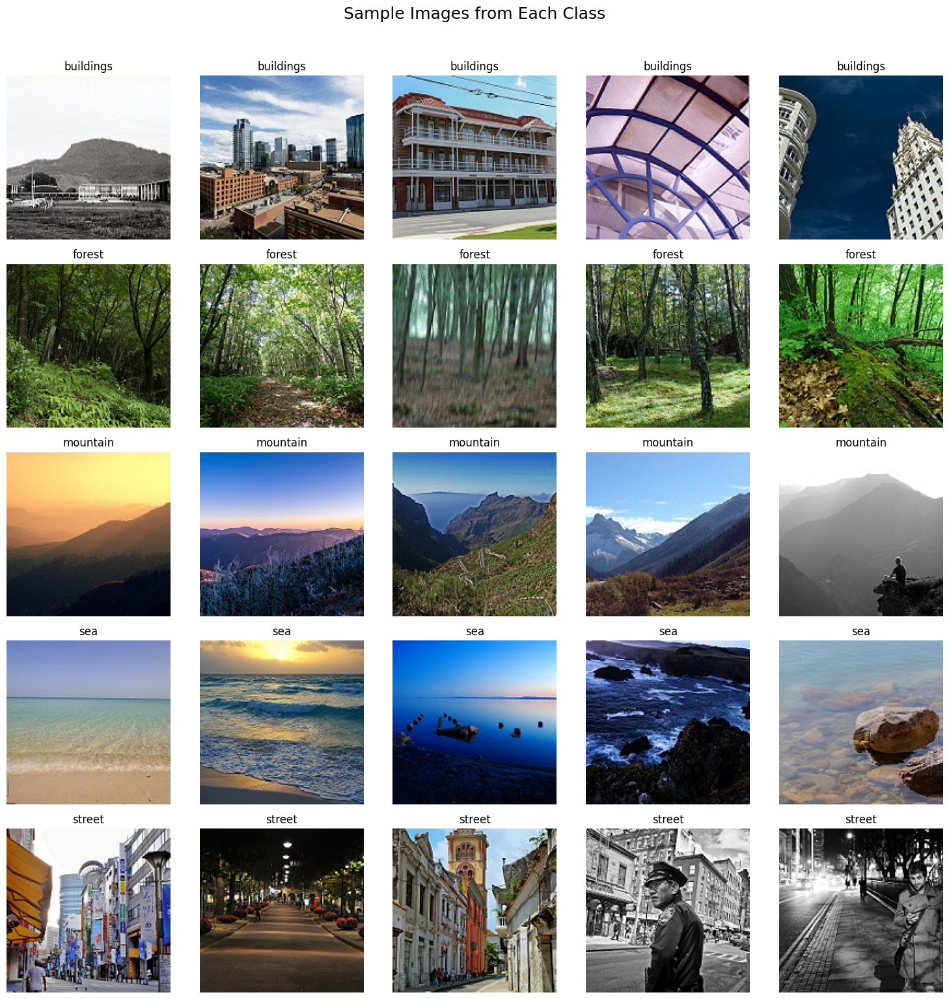

In [6]:
fig, axes = plt.subplots(len(class_to_idx), 5, figsize=(15, 3 * len(class_to_idx)))
fig.suptitle("Sample Images from Each Class", fontsize=18, y=1.02)

for class_idx, class_name in idx_to_class.items():
    # Find indices of images belonging to this class
    indices = [i for i, t in enumerate(base_dataset.targets) if t == class_idx][:5]
    for j, img_idx in enumerate(indices):
        img_path, _ = base_dataset.samples[img_idx]
        img = Image.open(img_path).convert('RGB')
        axes[class_idx, j].imshow(img)
        axes[class_idx, j].axis('off')
        axes[class_idx, j].set_title(class_name)
    # Hide unused axes if less than 5 images
    for j in range(len(indices), 5):
        axes[class_idx, j].axis('off')

plt.tight_layout()
plt.show()

In [7]:
# Initialize model
print(f"\nInitializing Custom CNN model...")
model = CustomCNN(num_classes=5).to(device)


Initializing Custom CNN model...


In [8]:
# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

Total parameters: 16,560,709
Trainable parameters: 16,560,709


In [9]:
# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)
    

In [10]:
# Train the model
print("\nStarting training...")
model, train_losses, train_accs, val_losses, val_accs, lr_history = train_model(
    model, train_loader, val_loader, criterion, optimizer, scheduler,
    num_epochs=50, early_stopping_patience=6
)


Starting training...

Epoch 1/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [01:09<00:00,  2.21it/s, loss=0.9545]


Train Loss: 0.8715 | Train Acc: 0.6403


Validation: 100%|██████████| 33/33 [00:08<00:00,  4.08it/s, loss=0.7006]


Val Loss: 0.6391 | Val Acc: 0.7166
✓ New best validation accuracy: 0.7166

Epoch 2/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:57<00:00,  2.70it/s, loss=0.6700]


Train Loss: 0.6257 | Train Acc: 0.7554


Validation: 100%|██████████| 33/33 [00:05<00:00,  6.14it/s, loss=0.4548]


Val Loss: 0.4433 | Val Acc: 0.8327
✓ New best validation accuracy: 0.8327

Epoch 3/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:57<00:00,  2.66it/s, loss=0.3375]


Train Loss: 0.5135 | Train Acc: 0.8063


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.05it/s, loss=0.9416]


Val Loss: 1.0338 | Val Acc: 0.6678
Patience: 1/6

Epoch 4/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.6807]


Train Loss: 0.4800 | Train Acc: 0.8238


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.97it/s, loss=1.1394]


Val Loss: 1.2308 | Val Acc: 0.5919
Patience: 2/6

Epoch 5/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.62it/s, loss=0.8357]


Train Loss: 0.4391 | Train Acc: 0.8380


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.04it/s, loss=0.2814]


Val Loss: 0.3496 | Val Acc: 0.8735
✓ New best validation accuracy: 0.8735

Epoch 6/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.61it/s, loss=0.4374]


Train Loss: 0.4084 | Train Acc: 0.8476


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.14it/s, loss=0.3383]


Val Loss: 0.4004 | Val Acc: 0.8540
Patience: 1/6

Epoch 7/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.62it/s, loss=0.3107]


Train Loss: 0.3853 | Train Acc: 0.8630


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.04it/s, loss=0.2925]


Val Loss: 0.3056 | Val Acc: 0.8858
✓ New best validation accuracy: 0.8858

Epoch 8/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.2150]


Train Loss: 0.3602 | Train Acc: 0.8728


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.06it/s, loss=0.2820]


Val Loss: 0.2863 | Val Acc: 0.8976
✓ New best validation accuracy: 0.8976

Epoch 9/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.57it/s, loss=0.3178]


Train Loss: 0.3576 | Train Acc: 0.8699


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.67it/s, loss=0.3923]


Val Loss: 0.3937 | Val Acc: 0.8588
Patience: 1/6

Epoch 10/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.3194]


Train Loss: 0.3325 | Train Acc: 0.8783


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.00it/s, loss=0.2603]


Val Loss: 0.3065 | Val Acc: 0.8896
Patience: 2/6

Epoch 11/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.2256]


Train Loss: 0.3156 | Train Acc: 0.8884


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.93it/s, loss=0.7846]


Val Loss: 0.3809 | Val Acc: 0.8701
Patience: 3/6

Epoch 12/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.58it/s, loss=0.1914]


Train Loss: 0.3001 | Train Acc: 0.8892


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.00it/s, loss=0.3277]


Val Loss: 0.2668 | Val Acc: 0.9024
✓ New best validation accuracy: 0.9024

Epoch 13/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.60it/s, loss=0.1666]


Train Loss: 0.3095 | Train Acc: 0.8873


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.92it/s, loss=0.4368]


Val Loss: 0.3164 | Val Acc: 0.8791
Patience: 1/6

Epoch 14/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.1915]


Train Loss: 0.2986 | Train Acc: 0.8926


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.79it/s, loss=0.1869]


Val Loss: 0.2591 | Val Acc: 0.9081
✓ New best validation accuracy: 0.9081

Epoch 15/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.2282]


Train Loss: 0.2842 | Train Acc: 0.8962


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.96it/s, loss=0.3224]


Val Loss: 0.2208 | Val Acc: 0.9209
✓ New best validation accuracy: 0.9209

Epoch 16/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.60it/s, loss=0.2120]


Train Loss: 0.2703 | Train Acc: 0.9014


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.00it/s, loss=0.3377]


Val Loss: 0.2206 | Val Acc: 0.9242
✓ New best validation accuracy: 0.9242

Epoch 17/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.65it/s, loss=0.1726]


Train Loss: 0.2677 | Train Acc: 0.9063


Validation: 100%|██████████| 33/33 [00:05<00:00,  5.96it/s, loss=0.3838]


Val Loss: 0.2444 | Val Acc: 0.9171
Patience: 1/6

Epoch 18/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.64it/s, loss=0.3080]


Train Loss: 0.2686 | Train Acc: 0.9044


Validation: 100%|██████████| 33/33 [00:05<00:00,  6.03it/s, loss=0.3355]


Val Loss: 0.3898 | Val Acc: 0.8706
Patience: 2/6

Epoch 19/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.65it/s, loss=0.2195]


Train Loss: 0.2589 | Train Acc: 0.9066


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.89it/s, loss=0.4464]


Val Loss: 0.2570 | Val Acc: 0.9047
Patience: 3/6

Epoch 20/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.61it/s, loss=0.3305]


Train Loss: 0.2542 | Train Acc: 0.9082


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.01it/s, loss=0.3340]


Val Loss: 0.2123 | Val Acc: 0.9251
✓ New best validation accuracy: 0.9251

Epoch 21/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.2048]


Train Loss: 0.2491 | Train Acc: 0.9060


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.10it/s, loss=0.6149]


Val Loss: 0.2674 | Val Acc: 0.9095
Patience: 1/6

Epoch 22/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.3195]


Train Loss: 0.2295 | Train Acc: 0.9173


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.06it/s, loss=0.1883]


Val Loss: 0.1918 | Val Acc: 0.9308
✓ New best validation accuracy: 0.9308

Epoch 23/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.1669]


Train Loss: 0.2239 | Train Acc: 0.9205


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.99it/s, loss=0.2142]


Val Loss: 0.2095 | Val Acc: 0.9242
Patience: 1/6

Epoch 24/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.0913]


Train Loss: 0.2301 | Train Acc: 0.9199


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.12it/s, loss=0.3872]


Val Loss: 0.1981 | Val Acc: 0.9313
✓ New best validation accuracy: 0.9313

Epoch 25/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.61it/s, loss=0.1951]


Train Loss: 0.2169 | Train Acc: 0.9213


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.07it/s, loss=0.3077]


Val Loss: 0.2545 | Val Acc: 0.9095
Patience: 1/6

Epoch 26/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.1957]


Train Loss: 0.2133 | Train Acc: 0.9246


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.02it/s, loss=0.3839]


Val Loss: 0.1998 | Val Acc: 0.9265
Patience: 2/6

Epoch 27/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.61it/s, loss=0.1847]


Train Loss: 0.1766 | Train Acc: 0.9364


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.04it/s, loss=0.2443]


Val Loss: 0.1517 | Val Acc: 0.9436
✓ New best validation accuracy: 0.9436

Epoch 28/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.2037]


Train Loss: 0.1565 | Train Acc: 0.9443


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.13it/s, loss=0.2747]


Val Loss: 0.1610 | Val Acc: 0.9365
Patience: 1/6

Epoch 29/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.1192]


Train Loss: 0.1498 | Train Acc: 0.9473


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.06it/s, loss=0.2638]


Val Loss: 0.1510 | Val Acc: 0.9441
✓ New best validation accuracy: 0.9441

Epoch 30/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.2453]


Train Loss: 0.1531 | Train Acc: 0.9454


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.95it/s, loss=0.2735]


Val Loss: 0.1527 | Val Acc: 0.9445
✓ New best validation accuracy: 0.9445

Epoch 31/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.65it/s, loss=0.2515]


Train Loss: 0.1480 | Train Acc: 0.9479


Validation: 100%|██████████| 33/33 [00:05<00:00,  6.10it/s, loss=0.2753]


Val Loss: 0.1649 | Val Acc: 0.9379
Patience: 1/6

Epoch 32/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.65it/s, loss=0.1130]


Train Loss: 0.1474 | Train Acc: 0.9481


Validation: 100%|██████████| 33/33 [00:05<00:00,  5.99it/s, loss=0.2312]


Val Loss: 0.1559 | Val Acc: 0.9408
Patience: 2/6

Epoch 33/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.64it/s, loss=0.1158]


Train Loss: 0.1436 | Train Acc: 0.9526


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.08it/s, loss=0.2216]


Val Loss: 0.1551 | Val Acc: 0.9441
Patience: 3/6

Epoch 34/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.60it/s, loss=0.0432]


Train Loss: 0.1316 | Train Acc: 0.9528


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.17it/s, loss=0.2177]


Val Loss: 0.1558 | Val Acc: 0.9427
Patience: 4/6

Epoch 35/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.60it/s, loss=0.2486]


Train Loss: 0.1273 | Train Acc: 0.9556


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.03it/s, loss=0.1890]


Val Loss: 0.1451 | Val Acc: 0.9479
✓ New best validation accuracy: 0.9479

Epoch 36/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.0830]


Train Loss: 0.1310 | Train Acc: 0.9527


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.98it/s, loss=0.2187]


Val Loss: 0.1513 | Val Acc: 0.9445
Patience: 1/6

Epoch 37/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.58it/s, loss=0.1057]


Train Loss: 0.1324 | Train Acc: 0.9551


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.29it/s, loss=0.2353]


Val Loss: 0.1525 | Val Acc: 0.9464
Patience: 2/6

Epoch 38/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.1154]


Train Loss: 0.1317 | Train Acc: 0.9553


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.29it/s, loss=0.2172]


Val Loss: 0.1482 | Val Acc: 0.9479
Patience: 3/6

Epoch 39/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.2252]


Train Loss: 0.1326 | Train Acc: 0.9530


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.04it/s, loss=0.2196]


Val Loss: 0.1510 | Val Acc: 0.9460
Patience: 4/6

Epoch 40/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.1694]


Train Loss: 0.1262 | Train Acc: 0.9553


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.04it/s, loss=0.2410]


Val Loss: 0.1524 | Val Acc: 0.9460
Patience: 5/6

Epoch 41/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.60it/s, loss=0.1366]


Train Loss: 0.1325 | Train Acc: 0.9554


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.18it/s, loss=0.2076]


Val Loss: 0.1474 | Val Acc: 0.9483
✓ New best validation accuracy: 0.9483

Epoch 42/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.1176]


Train Loss: 0.1273 | Train Acc: 0.9545


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.12it/s, loss=0.2166]


Val Loss: 0.1481 | Val Acc: 0.9483
Patience: 1/6

Epoch 43/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.3098]


Train Loss: 0.1337 | Train Acc: 0.9509


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.99it/s, loss=0.1934]


Val Loss: 0.1434 | Val Acc: 0.9493
✓ New best validation accuracy: 0.9493

Epoch 44/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.0716]


Train Loss: 0.1285 | Train Acc: 0.9547


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.92it/s, loss=0.1840]


Val Loss: 0.1444 | Val Acc: 0.9483
Patience: 1/6

Epoch 45/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.1197]


Train Loss: 0.1260 | Train Acc: 0.9558


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.07it/s, loss=0.2066]


Val Loss: 0.1464 | Val Acc: 0.9488
Patience: 2/6

Epoch 46/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.64it/s, loss=0.0858]


Train Loss: 0.1309 | Train Acc: 0.9546


Validation: 100%|██████████| 33/33 [00:05<00:00,  5.92it/s, loss=0.2032]


Val Loss: 0.1468 | Val Acc: 0.9502
✓ New best validation accuracy: 0.9502

Epoch 47/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.64it/s, loss=0.0520]


Train Loss: 0.1303 | Train Acc: 0.9550


Validation: 100%|██████████| 33/33 [00:05<00:00,  5.89it/s, loss=0.1873]


Val Loss: 0.1419 | Val Acc: 0.9488
Patience: 1/6

Epoch 48/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:58<00:00,  2.63it/s, loss=0.0838]


Train Loss: 0.1334 | Train Acc: 0.9508


Validation: 100%|██████████| 33/33 [00:04<00:00,  7.01it/s, loss=0.2537]


Val Loss: 0.1531 | Val Acc: 0.9431
Patience: 2/6

Epoch 49/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.59it/s, loss=0.2075]


Train Loss: 0.1262 | Train Acc: 0.9557


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.88it/s, loss=0.2162]


Val Loss: 0.1456 | Val Acc: 0.9493
Patience: 3/6

Epoch 50/50
------------------------------------------------------------


Training: 100%|██████████| 154/154 [00:59<00:00,  2.61it/s, loss=0.1221]


Train Loss: 0.1255 | Train Acc: 0.9559


Validation: 100%|██████████| 33/33 [00:04<00:00,  6.98it/s, loss=0.2181]

Val Loss: 0.1478 | Val Acc: 0.9488
Patience: 4/6



Training history plot saved as 'training_history.png'


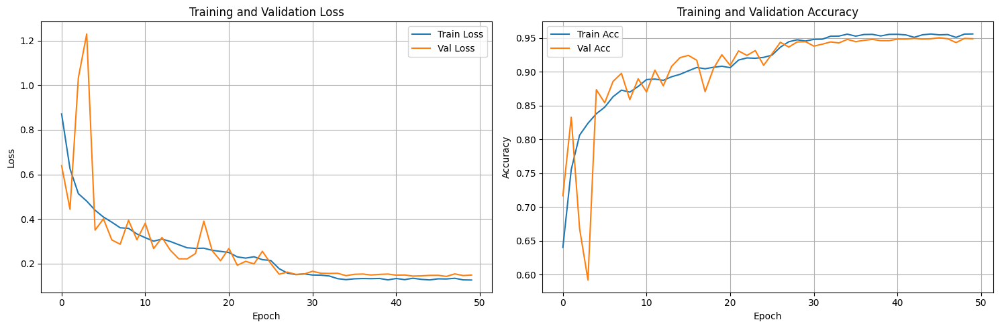

In [18]:
# Plot training history
plot_training_history(train_losses, train_accs, val_losses, val_accs)

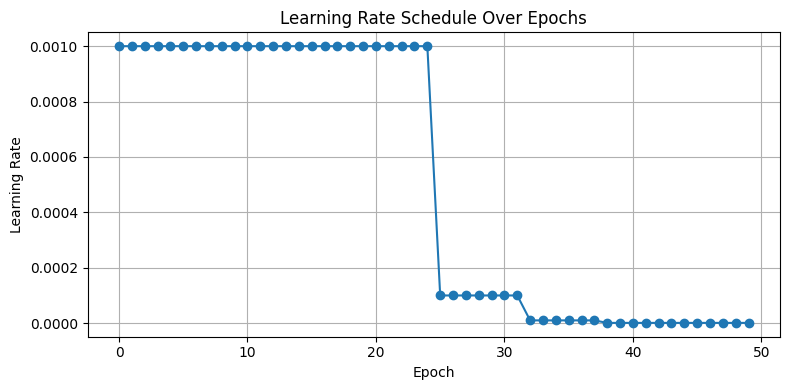

In [19]:
plt.figure(figsize=(8, 4))
plt.plot(lr_history, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Learning Rate Schedule Over Epochs')
plt.grid(True)
plt.tight_layout()
plt.show()

In [14]:
import pandas as pd

# Prepare data as a dictionary
history_dict = {
    'train_loss': train_losses,
    'train_acc': train_accs,
    'val_loss': val_losses,
    'val_acc': val_accs,
    'lr': lr_history
}

# Create DataFrame
history_df = pd.DataFrame(history_dict)

# Save to CSV
history_df.to_csv('/home/muhammad_adib/imgclass_cnn/training_history.csv', index_label='epoch')
print("Training history saved to 'training_history.csv'")

Training history saved to 'training_history.csv'


In [31]:
import pandas as pd

# Prepare data as a dictionary
history_dict = {
    'train_loss': train_losses,
    'train_acc': train_accs,
    'val_loss': val_losses,
    'val_acc': val_accs,
    'lr': lr_history
}

# Create DataFrame
history_df = pd.DataFrame(history_dict)

# Save to CSV
history_df.to_csv('/home/muhammad_adib/imgclass_cnn/training_history1.csv', index_label='epoch')
print("Training history saved to 'training_history1.csv'")# Evaluate on validation set (as final test)
print("\n" + "="*60)
print("FINAL EVALUATION ON VALIDATION SET")
print("="*60)
test_acc = evaluate_model(model, test_loader, class_names)

Training history saved to 'training_history1.csv'

FINAL EVALUATION ON VALIDATION SET


Testing: 100%|██████████| 33/33 [00:04<00:00,  6.87it/s]


Test Accuracy: 0.9512 (95.12%)

Classification Report:
              precision    recall  f1-score   support

   buildings       0.91      0.92      0.91       394
      forest       1.00      0.98      0.99       411
    mountain       0.94      0.98      0.96       456
         sea       0.98      0.94      0.96       416
      street       0.94      0.93      0.93       433

    accuracy                           0.95      2110
   macro avg       0.95      0.95      0.95      2110
weighted avg       0.95      0.95      0.95      2110



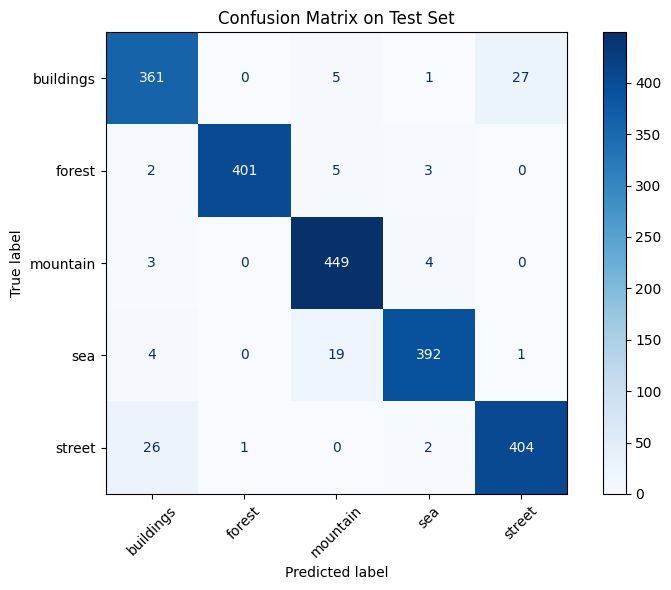

In [24]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get all predictions and true labels from the test set
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
fig_cm, ax_cm = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax_cm, cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix on Test Set")
plt.tight_layout()
plt.show()

In [21]:
# Save the model
torch.save({
    'model_state_dict': model.state_dict(),
    'class_names': class_names,
    'test_accuracy': test_acc
}, '/home/muhammad_adib/imgclass_cnn/intel_cnn_model.pth')
print("\nModel saved as 'intel_cnn_model.pth'")

if test_acc >= 0.90:
    print(f"\n✓ SUCCESS! Model achieved {test_acc*100:.2f}% accuracy (target: ≥90%)")
else:
    print(f"\n⚠ Model achieved {test_acc*100:.2f}% accuracy (target: ≥90%)")
    print("Consider training for more epochs or adjusting hyperparameters.")


Model saved as 'intel_cnn_model.pth'

✓ SUCCESS! Model achieved 95.12% accuracy (target: ≥90%)


In [12]:
import torch
import torch.nn.functional as F

def tta_inference(model, images, device):
    model.eval()
    batch_size, c, h, w = images.size()
    
    # 1. Define our augmentations
    # We use horizontal flip and slight shifts/crops
    with torch.no_grad():
        # Original
        out1 = model(images)
        
        # Horizontal Flip
        out2 = model(torch.flip(images, dims=[3]))
        
        # Slight Shift Left/Up (using roll for speed)
        out3 = model(torch.roll(images, shifts=(5, 5), dims=(2, 3)))
        
        # Slight Shift Right/Down
        out4 = model(torch.roll(images, shifts=(-5, -5), dims=(2, 3)))

        # 2. Convert all to probabilities (Softmax) before averaging
        # This is the secret to why TTA usually outperforms single-pass
        p1 = F.softmax(out1, dim=1)
        p2 = F.softmax(out2, dim=1)
        p3 = F.softmax(out3, dim=1)
        p4 = F.softmax(out4, dim=1)
        
        # 3. Average the probabilities
        avg_probs = (p1 + p2 + p3 + p4) / 4
        
        return avg_probs
    
# TTA evaluation loop
all_tta_preds = []
all_labels = []
for inputs, labels in test_loader:
    for img, label in zip(inputs, labels):
        pred = tta_inference(model, img.unsqueeze(0).to(device), device)
        all_tta_preds.append(pred)
        all_labels.append(label.item())

tta_acc = accuracy_score(all_labels, [torch.argmax(p).item() for p in all_tta_preds])
print(f"TTA Test Accuracy: {tta_acc:.4f} ({tta_acc*100:.2f}%)")


TTA Test Accuracy: 0.9521 (95.21%)


In [13]:
from sklearn.metrics import accuracy_score

def evaluate_with_tta(model, test_loader, device):
    all_preds = []
    all_labels = []
    
    model.eval()
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            
            # Get TTA probabilities
            probs = tta_inference(model, images, device)
            
            # Get the highest probability class
            preds = torch.argmax(probs, dim=1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())
            
    # Final Scikit-Learn Accuracy
    acc = accuracy_score(all_labels, all_preds)
    print(f"Final TTA Accuracy: {acc * 100:.2f}%")
    return acc

print("\nEvaluating with TTA on test set...")
tta_acc = evaluate_with_tta(model, test_loader, device)
print(f"TTA Test Accuracy: {tta_acc:.4f} ({tta_acc*100:.2f}%)")


Evaluating with TTA on test set...
Final TTA Accuracy: 95.21%
TTA Test Accuracy: 0.9521 (95.21%)


## Explainable AI - Grad-CAM Visualization

In [5]:
import cv2
import torch.nn.functional as F

class GradCAM:
    """Grad-CAM implementation for CNN visualization"""
    
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        
        # Register hooks
        self.target_layer.register_forward_hook(self._forward_hook)
        self.target_layer.register_backward_hook(self._backward_hook)
    
    def _forward_hook(self, module, input, output):
        self.activations = output.detach()
    
    def _backward_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach()
    
    def generate_cam(self, image_tensor, class_idx=None):
        """Generate Grad-CAM heatmap for an image"""
        self.model.eval()
        
        # Forward pass
        image_tensor = image_tensor.unsqueeze(0).to(device)
        image_tensor.requires_grad = True
        output = self.model(image_tensor)
        
        # Get predicted class if not specified
        if class_idx is None:
            class_idx = output.argmax(dim=1).item()
        
        # Backward pass
        self.model.zero_grad()
        score = output[0, class_idx]
        score.backward()
        
        # Get gradients and activations
        gradients = self.gradients.cpu().numpy()[0]
        activations = self.activations.cpu().numpy()[0]
        
        # Compute weights (global average pooling of gradients)
        weights = np.mean(gradients, axis=(1, 2))
        
        # Compute weighted sum of activations
        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i]
        
        # Apply ReLU and normalize
        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        
        return cam, class_idx, output.softmax(dim=1)[0, class_idx].item()


def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Denormalize image tensor for visualization"""
    tensor = tensor.clone()
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor.clamp(0, 1)


def visualize_gradcam(model, image_tensor, target_layer, class_names, true_label=None):
    """Visualize Grad-CAM for a single image"""
    grad_cam = GradCAM(model, target_layer)
    cam, pred_class, confidence = grad_cam.generate_cam(image_tensor)
    
    # Denormalize image for display
    img = denormalize(image_tensor).permute(1, 2, 0).cpu().numpy()
    
    # Create heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
    overlay = 0.5 * img + 0.5 * heatmap
    
    # Plot results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(img)
    axes[0].set_title(f"Original Image\nTrue: {class_names[true_label] if true_label is not None else 'N/A'}")
    axes[0].axis('off')
    
    axes[1].imshow(cam, cmap='jet')
    axes[1].set_title("Grad-CAM Heatmap")
    axes[1].axis('off')
    
    axes[2].imshow(overlay)
    axes[2].set_title(f"Overlay\nPredicted: {class_names[pred_class]} ({confidence*100:.1f}%)")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return pred_class, confidence


# Initialize Grad-CAM with the last convolutional block (conv4)
# The target layer should be the last Conv2d layer in conv4
target_layer = model.conv4[9]  # Last Conv2d in conv4 block

print("Grad-CAM initialized successfully!")
print(f"Target layer: {target_layer}")

Grad-CAM initialized successfully!
Target layer: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)


Grad-CAM Visualization for Test Images

Sample 1/5


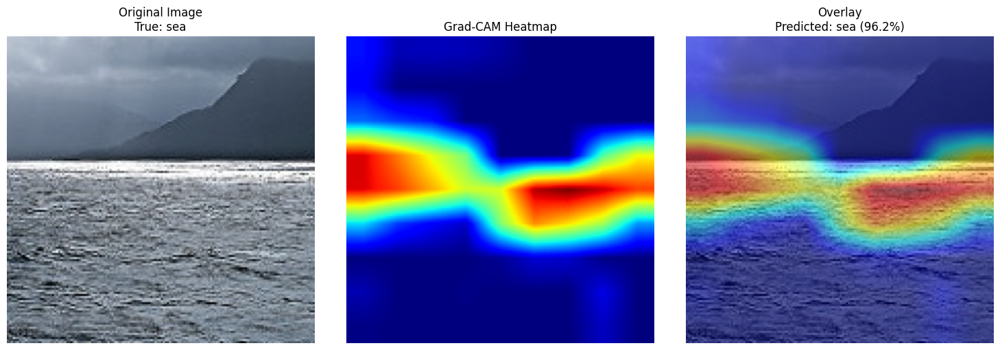

True: sea, Predicted: sea, Confidence: 96.2% ✓ Correct

Sample 2/5


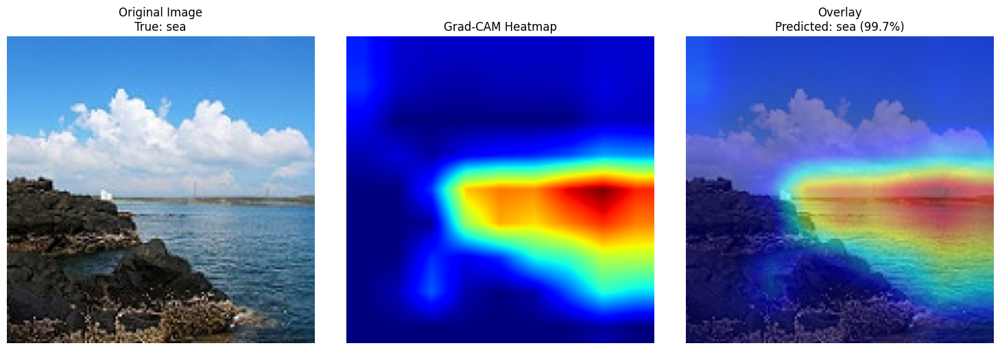

True: sea, Predicted: sea, Confidence: 99.7% ✓ Correct

Sample 3/5


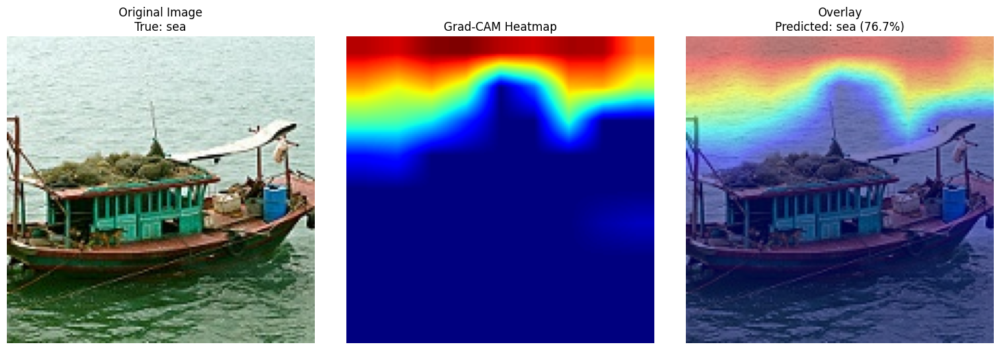

True: sea, Predicted: sea, Confidence: 76.7% ✓ Correct

Sample 4/5


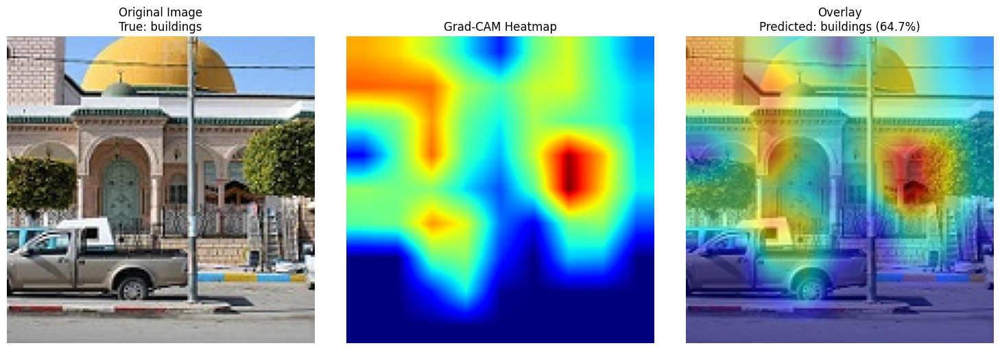

True: buildings, Predicted: buildings, Confidence: 64.7% ✓ Correct

Sample 5/5


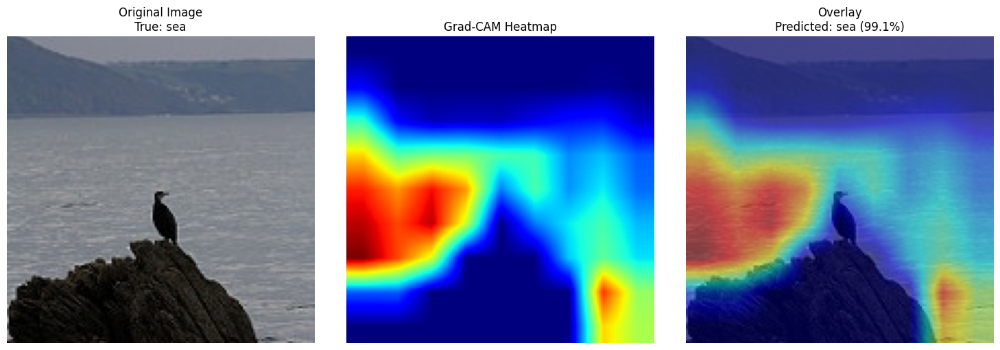

True: sea, Predicted: sea, Confidence: 99.1% ✓ Correct


In [14]:
# Visualize Grad-CAM for multiple test images
print("Grad-CAM Visualization for Test Images")
print("=" * 50)

# Select random test images
num_samples = 5
random_indices = np.random.choice(len(test_dataset), num_samples, replace=False)

for i, idx in enumerate(random_indices):
    print(f"\nSample {i+1}/{num_samples}")
    img, label = test_dataset[idx]
    pred_class, conf = visualize_gradcam(model, img, target_layer, class_names, true_label=label)
    
    # Check if prediction is correct
    status = "✓ Correct" if pred_class == label else "✗ Wrong"
    print(f"True: {class_names[label]}, Predicted: {class_names[pred_class]}, Confidence: {conf*100:.1f}% {status}")

Grad-CAM Comparison Across Classes


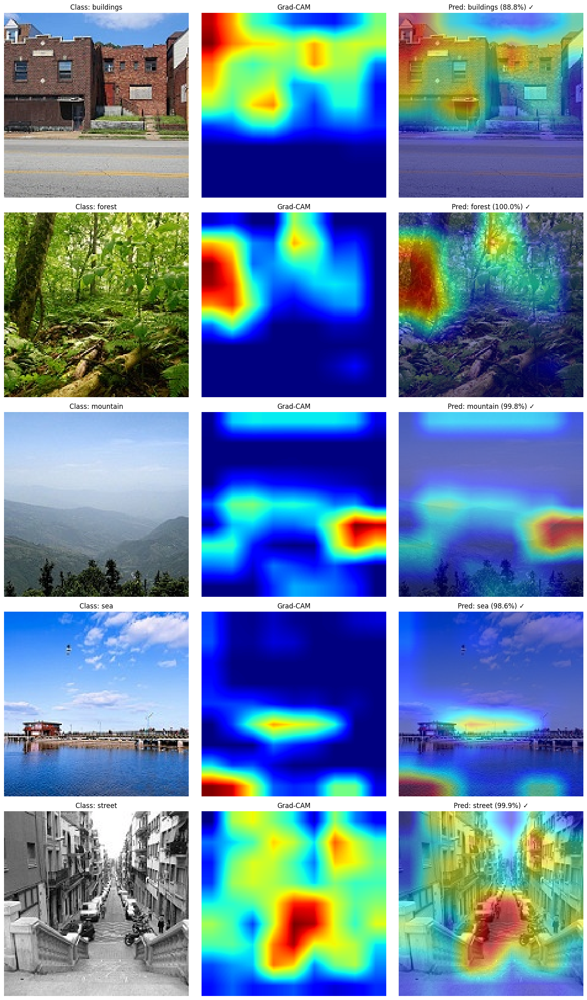


Grad-CAM comparison saved to 'gradcam_all_classes.png'


In [9]:
# Compare Grad-CAM across all classes
print("Grad-CAM Comparison Across Classes")
print("=" * 50)

fig, axes = plt.subplots(len(class_names), 3, figsize=(15, 5 * len(class_names)))

for i, class_name in enumerate(class_names):
    # Find an image from each class
    class_indices = [idx for idx, (_, label) in enumerate(test_dataset) if class_names[label] == class_name]
    
    if len(class_indices) > 0:
        sample_idx = np.random.choice(class_indices)
        img, label = test_dataset[sample_idx]
        
        grad_cam = GradCAM(model, target_layer)
        cam, pred_class, confidence = grad_cam.generate_cam(img)
        
        # Denormalize image
        img_display = denormalize(img).permute(1, 2, 0).cpu().numpy()
        
        # Create heatmap overlay
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
        overlay = 0.5 * img_display + 0.5 * heatmap
        
        axes[i, 0].imshow(img_display)
        axes[i, 0].set_title(f"Class: {class_name}")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(cam, cmap='jet')
        axes[i, 1].set_title("Grad-CAM")
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(overlay)
        pred_status = "✓" if pred_class == label else "✗"
        axes[i, 2].set_title(f"Pred: {class_names[pred_class]} ({confidence*100:.1f}%) {pred_status}")
        axes[i, 2].axis('off')

plt.tight_layout()
plt.savefig('gradcam_all_classes.png', dpi=150, bbox_inches='tight')
plt.show()
print("\nGrad-CAM comparison saved to 'gradcam_all_classes.png'")

Prediction Confidence Bar Charts


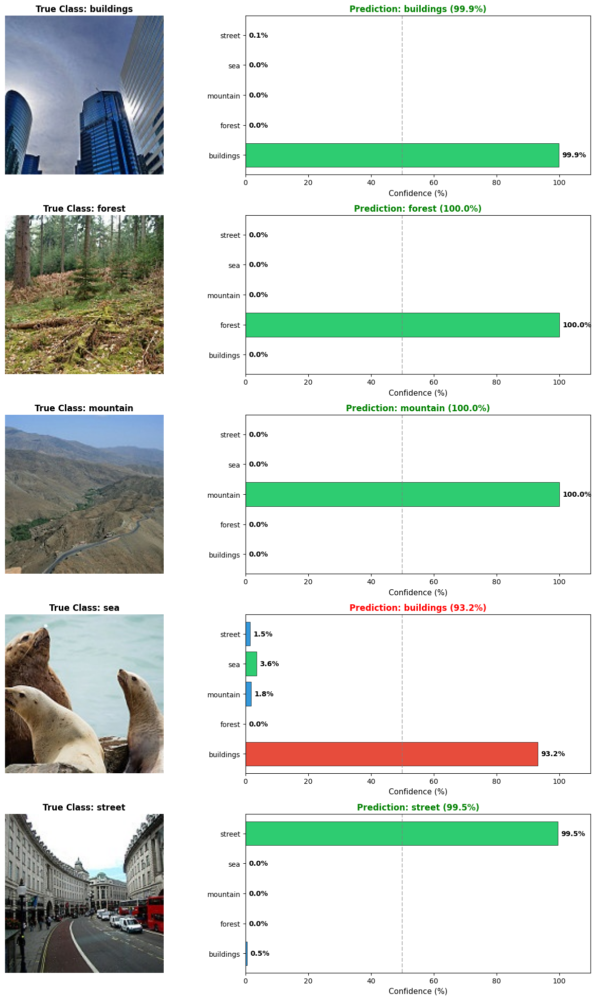


Legend:
  🟢 Green bar = True class
  🔵 Blue bars = Other classes
  🔴 Red bar = Wrong prediction (if any)

Chart saved to 'prediction_confidence_barchart.png'


In [11]:
# Prediction Confidence Bar Charts for Each Class
print("Prediction Confidence Bar Charts")
print("=" * 50)

def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Denormalize image tensor for visualization"""
    tensor = tensor.clone()
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor.clamp(0, 1)

import torch.nn.functional as F
import matplotlib.pyplot as plt

# Get one sample image from each class
fig, axes = plt.subplots(len(class_names), 2, figsize=(14, 4 * len(class_names)))

for i, class_name in enumerate(class_names):
    # Find an image from this class
    class_indices = [idx for idx, (_, label) in enumerate(test_dataset) if class_names[label] == class_name]
    
    if len(class_indices) > 0:
        sample_idx = np.random.choice(class_indices)
        img, true_label = test_dataset[sample_idx]
        
        # Get model prediction
        model.eval()
        with torch.no_grad():
            img_batch = img.unsqueeze(0).to(device)
            outputs = model(img_batch)
            probabilities = F.softmax(outputs, dim=1)[0]
            percentages = probabilities.cpu().numpy() * 100
        
        # Denormalize image for display
        img_display = denormalize(img).permute(1, 2, 0).cpu().numpy()
        
        # Display the image
        axes[i, 0].imshow(img_display)
        axes[i, 0].set_title(f"True Class: {class_name}", fontsize=12, fontweight='bold')
        axes[i, 0].axis('off')
        
        # Create bar chart with color coding
        colors = ['#2ecc71' if j == true_label else '#3498db' for j in range(len(class_names))]
        pred_class = np.argmax(percentages)
        if pred_class != true_label:
            colors[pred_class] = '#e74c3c'  # Red for wrong prediction
        
        bars = axes[i, 1].barh(class_names, percentages, color=colors, edgecolor='black', linewidth=0.5)
        
        # Add percentage labels on bars
        for bar, pct in zip(bars, percentages):
            width = bar.get_width()
            axes[i, 1].text(width + 1, bar.get_y() + bar.get_height()/2, 
                           f'{pct:.1f}%', va='center', fontsize=10, fontweight='bold')
        
        axes[i, 1].set_xlim(0, 110)
        axes[i, 1].set_xlabel('Confidence (%)', fontsize=11)
        axes[i, 1].set_title(f'Prediction: {class_names[pred_class]} ({percentages[pred_class]:.1f}%)', 
                            fontsize=12, fontweight='bold',
                            color='green' if pred_class == true_label else 'red')
        axes[i, 1].axvline(x=50, color='gray', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig('prediction_confidence_barchart.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nLegend:")
print("  🟢 Green bar = True class")
print("  🔵 Blue bars = Other classes") 
print("  🔴 Red bar = Wrong prediction (if any)")
print("\nChart saved to 'prediction_confidence_barchart.png'")

In [4]:
import torch

# Load the checkpoint
checkpoint = torch.load('/home/muhammad_adib/imgclass_cnn/intel_cnn_model.pth', map_location=device)

# Re-initialize the model architecture (must match the saved model)
model = CustomCNN(num_classes=len(checkpoint['class_names'])).to(device)

# Load the saved weights
model.load_state_dict(checkpoint['model_state_dict'])

# Set to evaluation mode
model.eval()

# Access saved information
print(f"Classes: {checkpoint['class_names']}")
print(f"Test accuracy: {checkpoint['test_accuracy']*100:.2f}%")

Classes: ['buildings', 'forest', 'mountain', 'sea', 'street']
Test accuracy: 95.12%
